# Hough transform
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/YoniChechik/AI_is_Math/blob/master/c_04b_hough_transform/hough_transform.ipynb)



In [1]:
# to run in google colab
import sys

if "google.colab" in sys.modules:

    def download_from_web(url):
        import requests

        response = requests.get(url)
        if response.status_code == 200:
            with open(url.split("/")[-1], "wb") as file:
                file.write(response.content)
        else:
            raise Exception(f"Failed to download the image. Status code: {response.status_code}")

    download_from_web("https://github.com/YoniChechik/AI_is_Math/raw/master/c_04b_hough_transform/edge_bold.bmp")
    download_from_web("https://github.com/YoniChechik/AI_is_Math/raw/master/c_04b_hough_transform/building.jpg")


In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

figsize = (10, 10)


## Import an image


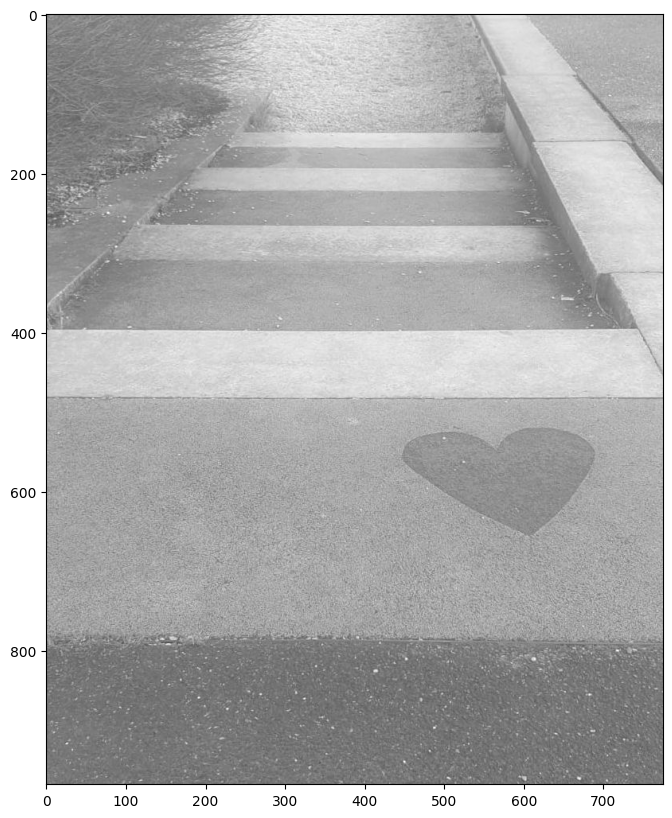

In [4]:
im3 = cv2.imread("/content/Groupe2_Image1.jpeg")
im = cv2.cvtColor(im3, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=figsize)
plt.imshow(im, cmap="gray", vmin=0, vmax=255)
plt.show()


## Find edges of an image using Canny
For more details about Canny edge detection, look at lecture 3


In [36]:
im.shape

(968, 775)

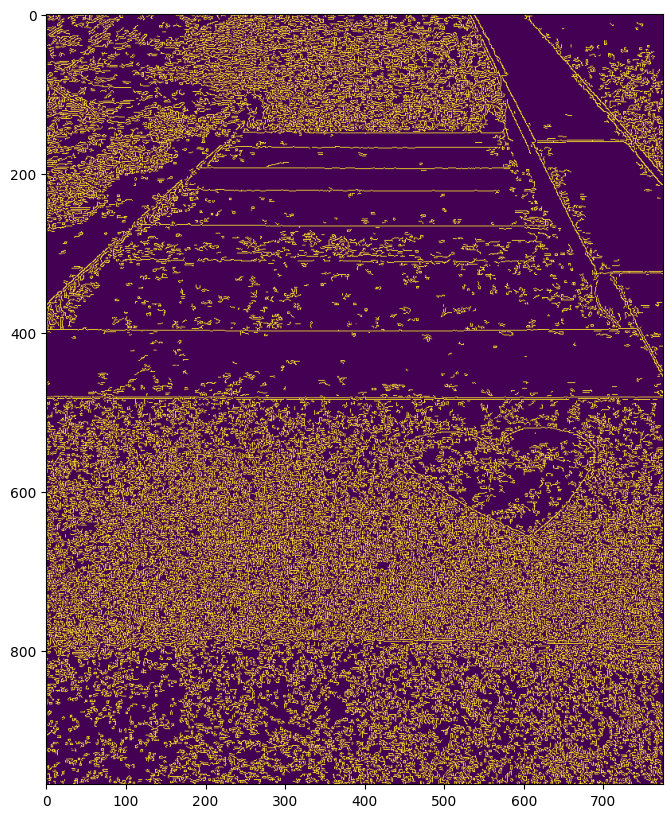

In [37]:
mag_im = cv2.Canny(im, 50, 100)

plt.figure(figsize=figsize)
plt.imshow(mag_im)
plt.show()


## Initialize accumulation matrix


In [38]:
# choose R size
r_step = 1
rmax = np.sqrt(im.shape[0] ** 2 + im.shape[1] ** 2)
r_vec = np.arange(-rmax, rmax, r_step)

# choose theta size
t_step = np.pi / 180
t_vec = np.arange(0, np.pi, t_step)

# accumulation matrix
acc_mat = np.zeros((r_vec.shape[0], t_vec.shape[0]))


## Fill accumulation matrix


In [39]:
# get indices of edges
edge_inds = np.argwhere(mag_im > 0)

# run on all theta and edge indices and find corresponding R
for t_ind, t0 in enumerate(t_vec):
    for yx in edge_inds:
        x = yx[1]
        y = yx[0]

        r0 = x * np.cos(t0) + y * np.sin(t0)
        r_ind = np.argmin(np.abs(r0 - r_vec))

        acc_mat[r_ind, t_ind] += 1


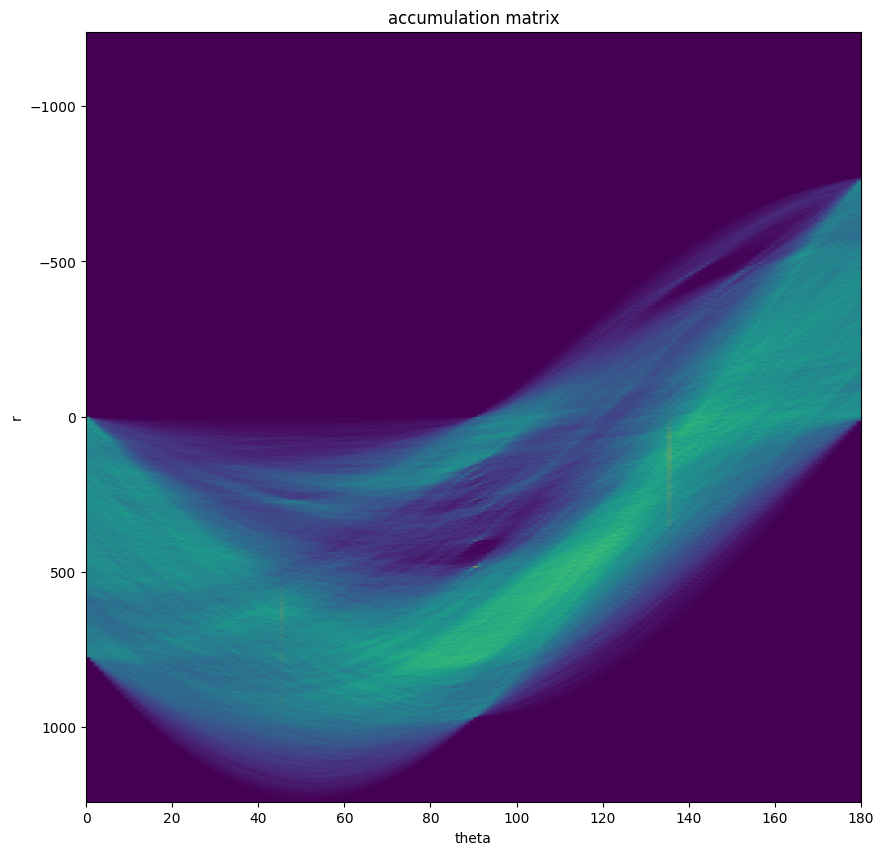

In [40]:
plt.figure(figsize=figsize)
plt.imshow(acc_mat, extent=[0, 180, rmax, -rmax], aspect="auto")
plt.xlabel("theta")
plt.ylabel("r")
plt.title("accumulation matrix")
plt.show()


## Threshold accumulation matrix


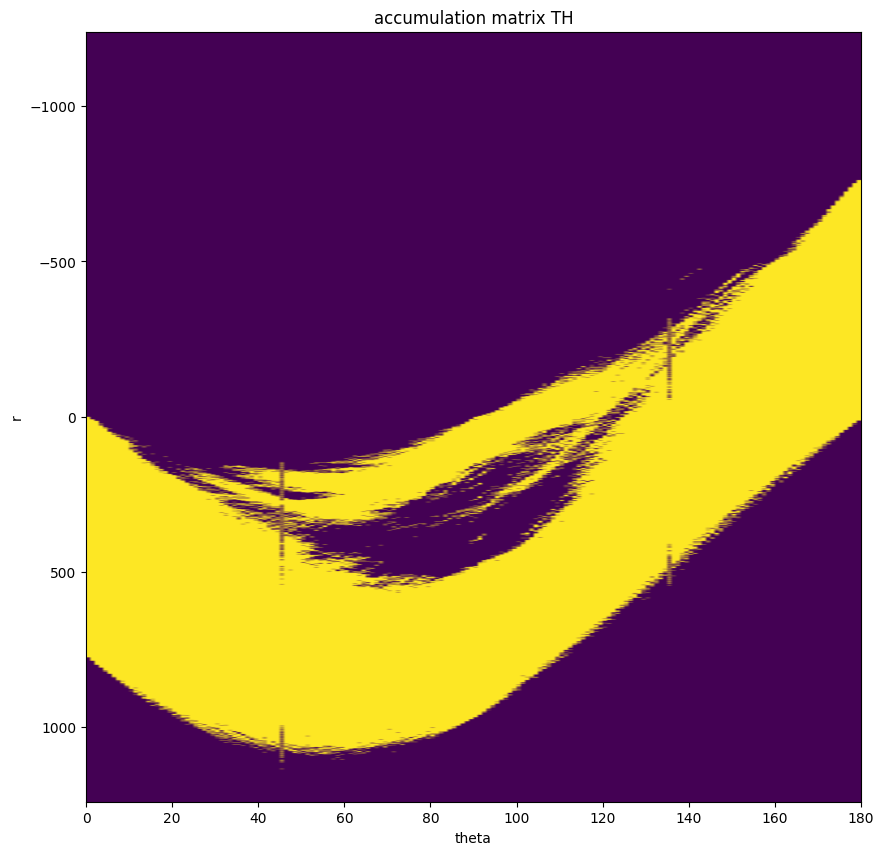

In [45]:
TH = 100
acc_mat_th = acc_mat > TH

plt.figure(figsize=figsize)
plt.imshow(acc_mat_th, extent=[0, 180, rmax, -rmax], aspect="auto")
plt.xlabel("theta")
plt.ylabel("r")
plt.title("accumulation matrix TH")
plt.show()


## Plot lines found by hough


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
(rho,theta): (np.float64(966.9802420928931), np.float64(64.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(65.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(66.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(67.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(68.00000000000001))
(rho,theta): (np.float64(966.9802420928931), np.float64(69.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(70.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(71.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(72.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(73.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(74.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(75.0))
(rho,theta): (np.float64(966.9802420928931), np.float64(76.00000000000001))
(rho,theta): (np.float64(966.9802420928931), np.float64(77.0))
(rho,theta): (

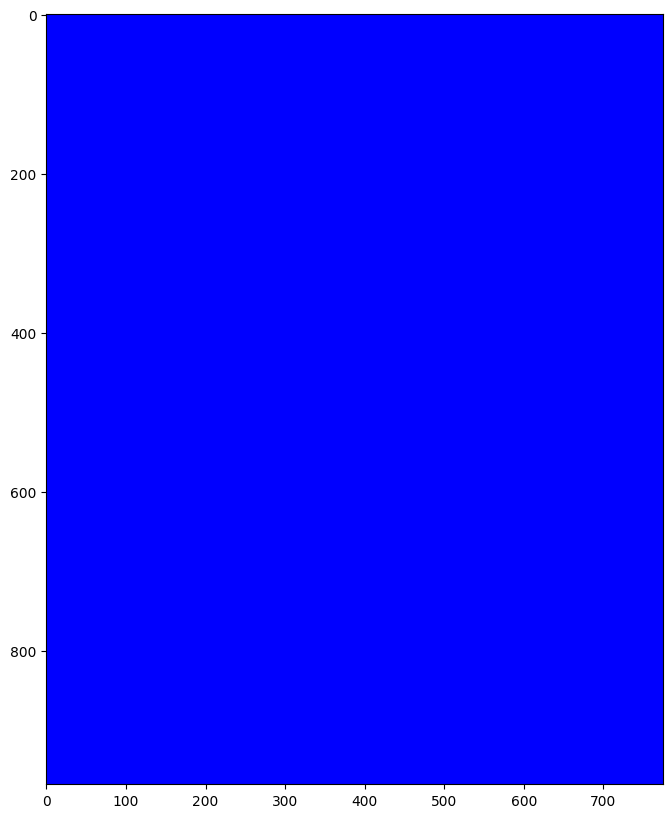

In [46]:
# get indices of acc_mat_th
edge_inds = np.argwhere(acc_mat_th > 0)

res = im3.copy()
for r_ind, t_ind in edge_inds:
    rho = r_vec[r_ind]
    theta = t_vec[t_ind]

    print("(rho,theta): " + str((rho, theta / np.pi * 180)))

    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))

    res = cv2.line(res, (x1, y1), (x2, y2), (0, 0, 255), thickness=1)

plt.figure(figsize=figsize)
plt.imshow(res)
plt.show()


## Try cv2.HoughLines
This implementation is faster since it was done in C


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
(rho,theta): (np.float32(1002.0), np.float32(67.99999))
(rho,theta): (np.float32(1019.0), np.float32(67.99999))
(rho,theta): (np.float32(1027.0), np.float32(67.99999))
(rho,theta): (np.float32(143.0), np.float32(69.99999))
(rho,theta): (np.float32(576.0), np.float32(69.99999))
(rho,theta): (np.float32(569.0), np.float32(71.0))
(rho,theta): (np.float32(118.0), np.float32(73.99999))
(rho,theta): (np.float32(197.0), np.float32(84.99999))
(rho,theta): (np.float32(468.0), np.float32(93.0))
(rho,theta): (np.float32(241.0), np.float32(97.0))
(rho,theta): (np.float32(-47.0), np.float32(99.99999))
(rho,theta): (np.float32(-48.0), np.float32(101.0))
(rho,theta): (np.float32(404.0), np.float32(103.99999))
(rho,theta): (np.float32(-68.0), np.float32(105.0))
(rho,theta): (np.float32(187.0), np.float32(105.0))
(rho,theta): (np.float32(109.0), np.float32(106.0))
(rho,theta): (np.float32(377.0), np.float32(107.0))
(rho,theta

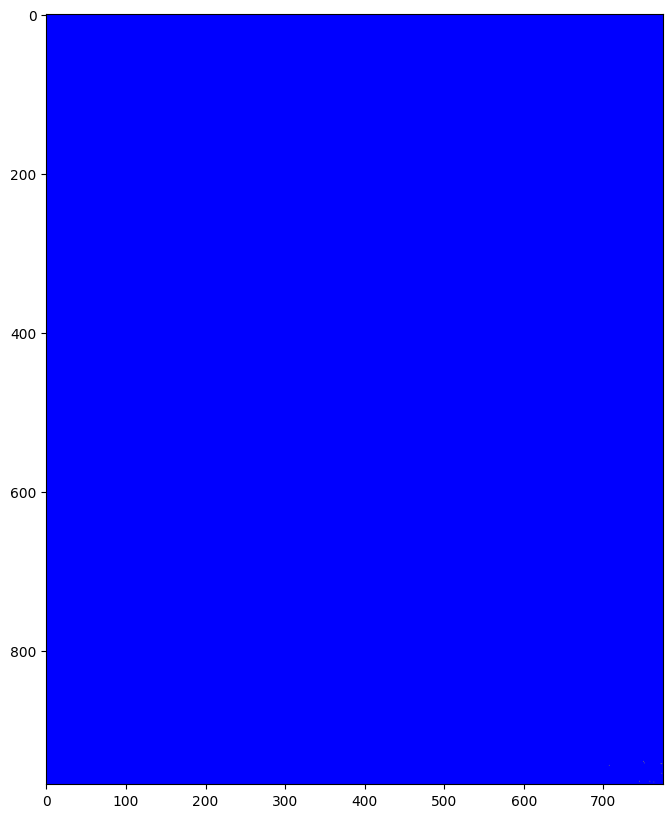

In [47]:
lines = cv2.HoughLines(mag_im, r_step, t_step, TH)
res = im3.copy()

for r_t in lines:
    rho = r_t[0, 0]
    theta = r_t[0, 1]

    print("(rho,theta): " + str((rho, theta / np.pi * 180)))

    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))

    res = cv2.line(res, (x1, y1), (x2, y2), (0, 0, 255), thickness=1)

plt.figure(figsize=figsize)
plt.imshow(res)
plt.show()


## Complete new example of a more complex image
We can see on the bottom horizontal lines that the "noise" of the tree top edges is interfeering with the line detection.


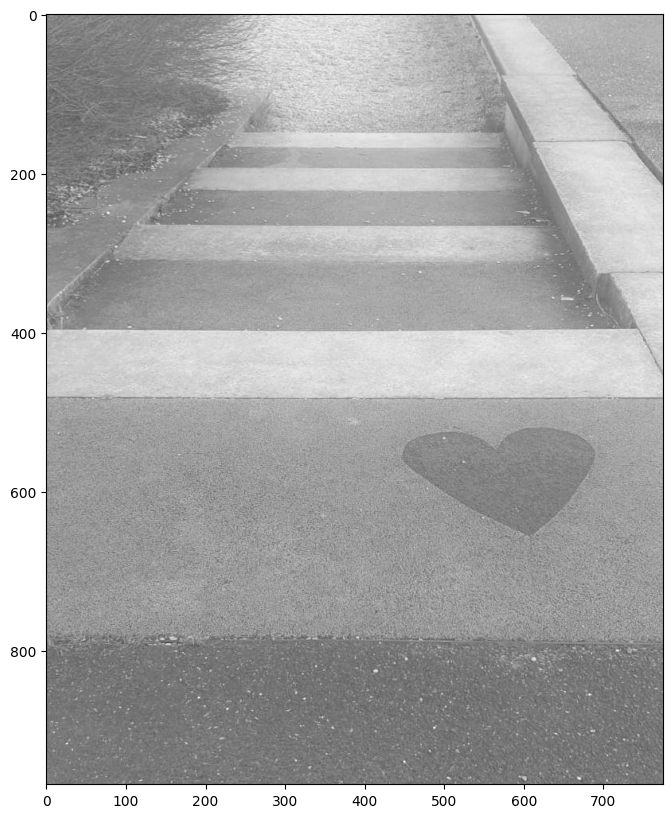

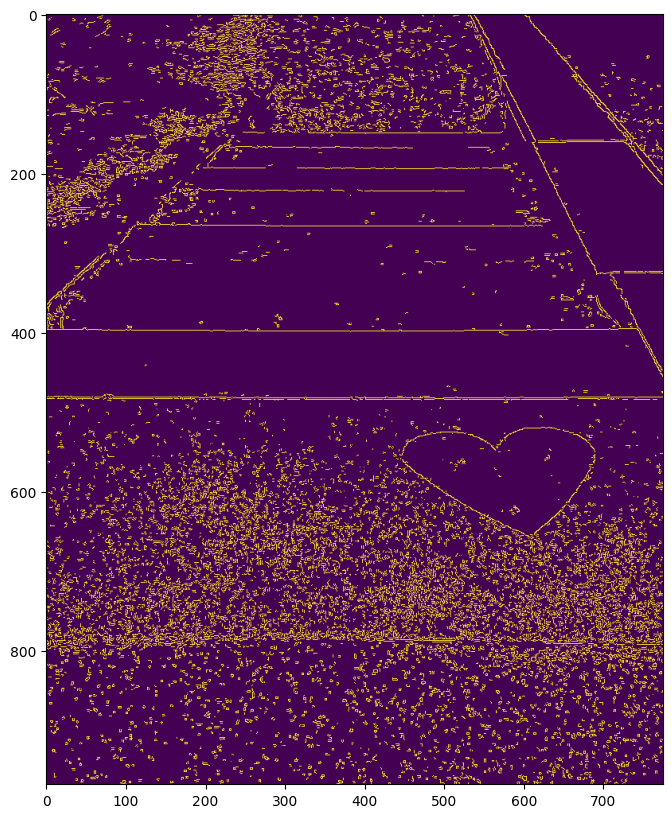

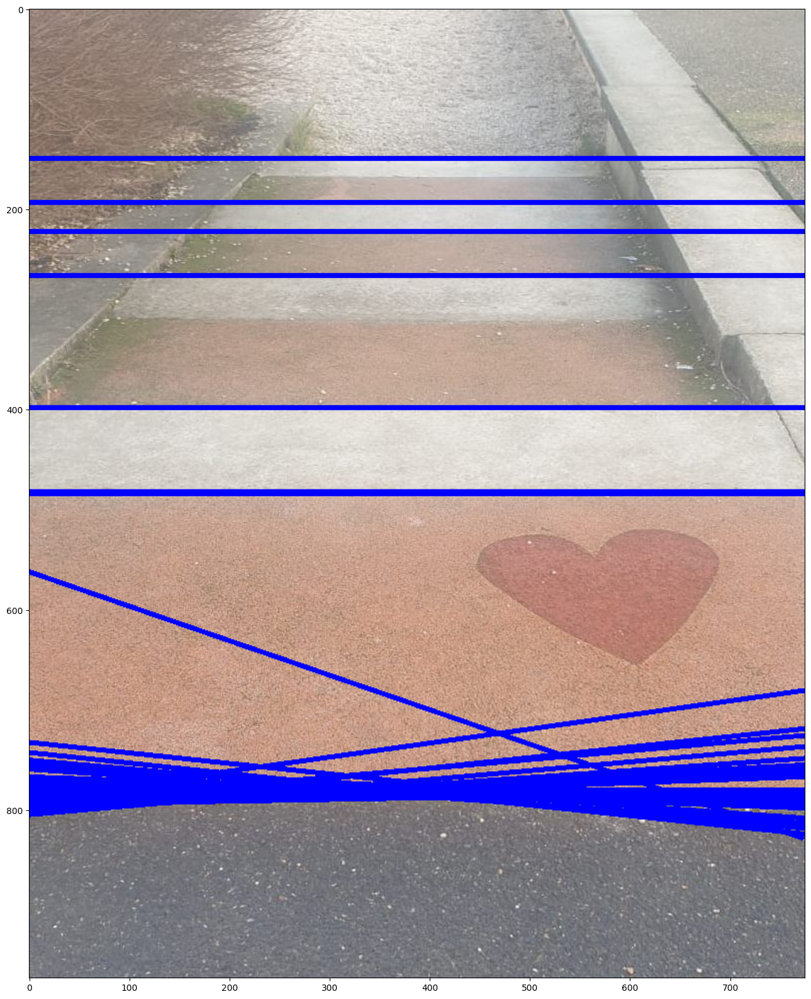

In [81]:
im3 = cv2.imread("/content/Groupe2_Image1.jpeg")
im3 = cv2.cvtColor(im3, cv2.COLOR_BGR2RGB)
im = cv2.cvtColor(im3, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=figsize)
plt.imshow(im, cmap="gray", vmin=0, vmax=255)
plt.show()

mag_im = cv2.Canny(im, 100, 150)

plt.figure(figsize=figsize)
plt.imshow(mag_im)
plt.show()

TH = 200
lines = cv2.HoughLines(mag_im, r_step, t_step, TH)
res = im3.copy()

for r_t in lines:
    rho = r_t[0, 0]
    theta = r_t[0, 1]

    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))

    res = cv2.line(res, (x1, y1), (x2, y2), (0, 0, 255), thickness=3)

plt.figure(figsize=(20, 20))
plt.imshow(res)
plt.show()


In [ ]:
#PARALLEL LINES DETECTION
# Define a function named parallel_lines that takes two lines represented by lists (line1 and line2) as arguments.
def parallel_lines(line1, line2):
    # Check if the slopes of the two lines are equal.
    # The condition line1[0]/line1[1] == line2[0]/line2[1] compares the slopes of the lines.
    return line1[0]/line1[1] == line2[0]/line2[1]

# Test the function with different lines represented by lists and print the results.

# Test case 1
# 2x + 3y = 4, 2x + 3y = 8
print(parallel_lines([2,3,4], [2,3,8]))

# Test case 2
# 2x + 3y = 4, 4x - 3y = 8
print(parallel_lines([2,3,4], [4,-3,8]))

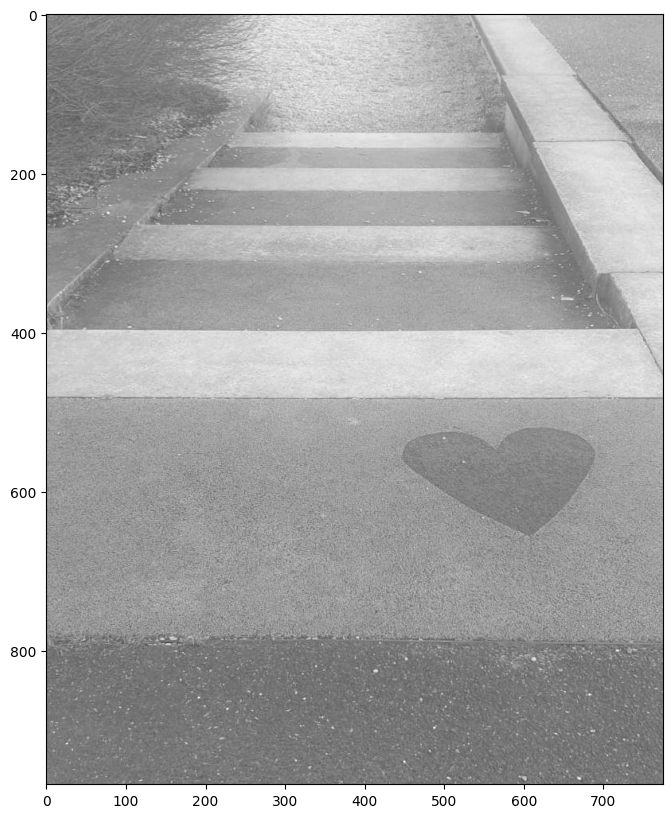

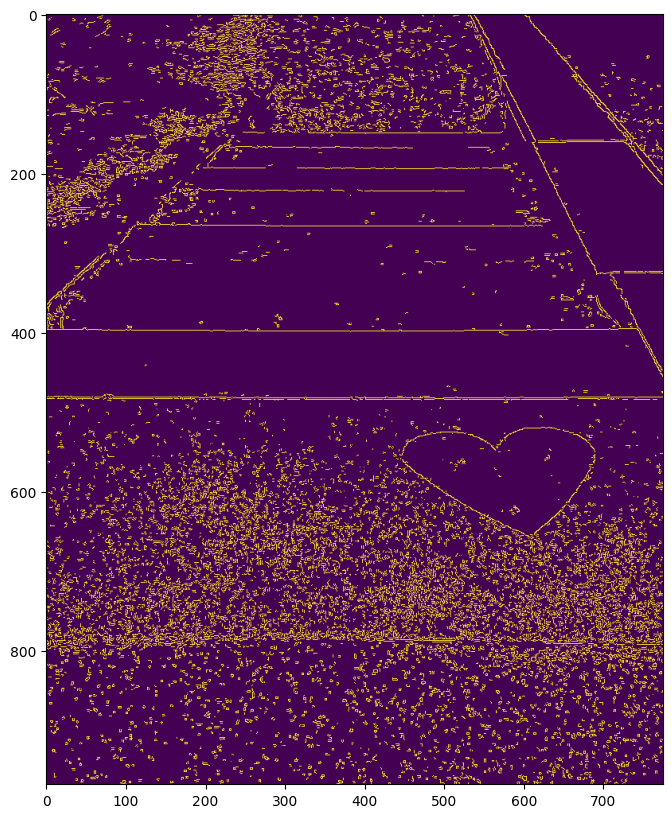

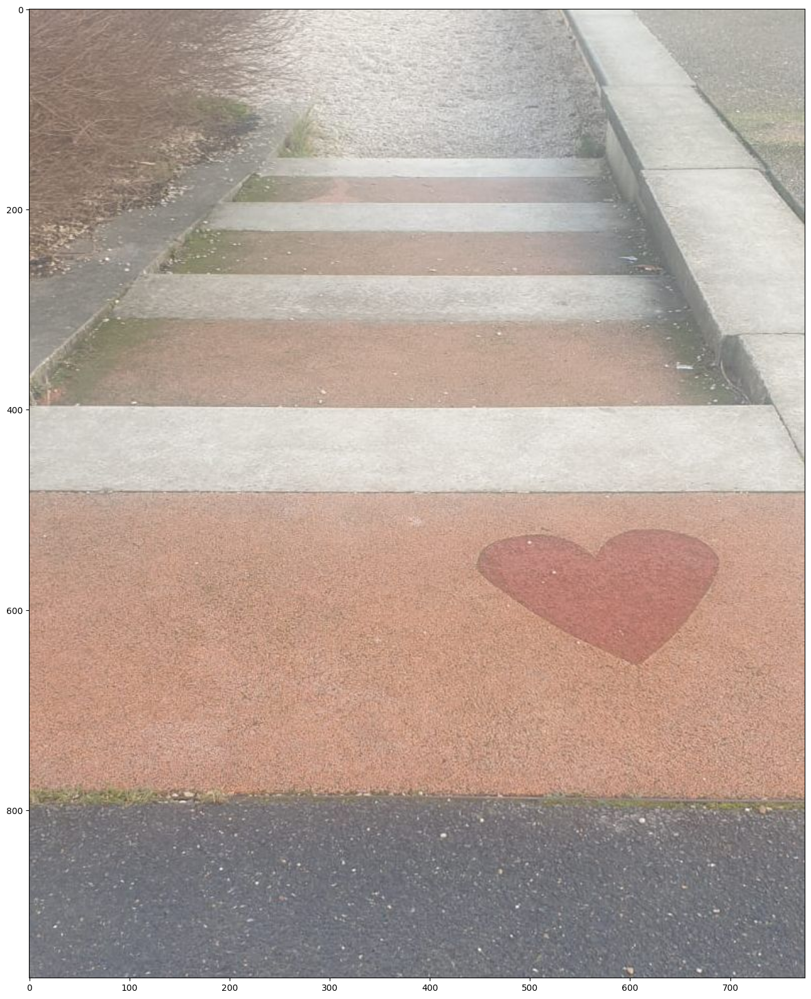

In [82]:
im3 = cv2.imread("/content/Groupe2_Image1.jpeg")
im3 = cv2.cvtColor(im3, cv2.COLOR_BGR2RGB)
im = cv2.cvtColor(im3, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=figsize)
plt.imshow(im, cmap="gray", vmin=0, vmax=255)
plt.show()

mag_im = cv2.Canny(im, 100, 150)

plt.figure(figsize=figsize)
plt.imshow(mag_im)
plt.show()

TH = 200
lines = cv2.HoughLines(mag_im, r_step, t_step, TH)
res = im3.copy()
list_cordonnates=[]
for r_t in lines:
    rho = r_t[0, 0]
    theta = r_t[0, 1]

    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    list_cordonnates.append([x1,y1,x2,y2])
    #res = cv2.line(res, (x1, y1), (x2, y2), (0, 0, 255), thickness=3)

plt.figure(figsize=(20, 20))
plt.imshow(res)
plt.show()

In [87]:
len(list_cordonnates)

32

In [84]:
liste_m=[]
for i in range(len(list_cordonnates)):
  m=(list_cordonnates[i][3]-list_cordonnates[i][1])/(list_cordonnates[i][2]-list_cordonnates[i][0])
  liste_m.append(m)


In [85]:
liste_m

[0.0005,
 0.0005,
 0.0005,
 0.0005,
 0.017508754377188594,
 0.0005002501250625312,
 0.0005,
 0.0005,
 0.017508754377188594,
 -0.03505257886830245,
 0.0005002501250625312,
 0.0005002501250625312,
 0.035035035035035036,
 -0.05260521042084168,
 -0.05257886830245368,
 -0.03505257886830245,
 0.035035035035035036,
 0.06967418546365915,
 -0.017517517517517518,
 -0.1404040404040404,
 0.08785140562248996,
 -0.08785140562248996,
 0.06970912738214644,
 -0.08785140562248996,
 -0.035035035035035036,
 0.34444444444444444,
 0.0005,
 -0.06970912738214644,
 0.10513078470824949,
 0.10513078470824949,
 -0.10513078470824949,
 0.05257886830245368]

In [83]:
list_cordonnates
for i in range(len(list_cordonnates)):
    if parallel_lines(list_cordonnates[i],list_cordonnates[i:1]):
      list_cordonnates.remove(list_cordonnates[j])


[[-1000, 483, 1000, 484],
 [-1000, 481, 1000, 482],
 [-1000, 265, 1000, 266],
 [-1000, 397, 1000, 398],
 [-1013, 758, 986, 793],
 [-1000, 784, 999, 785],
 [-1000, 192, 1000, 193],
 [-1000, 148, 1000, 149],
 [-1013, 760, 986, 795],
 [-971, 822, 1026, 752],
 [-1000, 779, 999, 780],
 [-1000, 781, 999, 782],
 [-1026, 731, 972, 801],
 [-956, 849, 1040, 744],
 [-957, 846, 1040, 741],
 [-971, 825, 1026, 755],
 [-1026, 735, 972, 805],
 [-1050, 681, 945, 820],
 [-985, 812, 1013, 777],
 [-881, 913, 1099, 635],
 [-1061, 657, 931, 832],
 [-926, 886, 1066, 711],
 [-1050, 686, 944, 825],
 [-927, 875, 1065, 700],
 [-971, 828, 1027, 758],
 [-1118, 177, 772, 828],
 [-1000, 221, 1000, 222],
 [-941, 868, 1053, 729],
 [-1070, 620, 918, 829],
 [-1071, 630, 917, 839],
 [-911, 896, 1077, 687],
 [-1038, 702, 959, 807]]

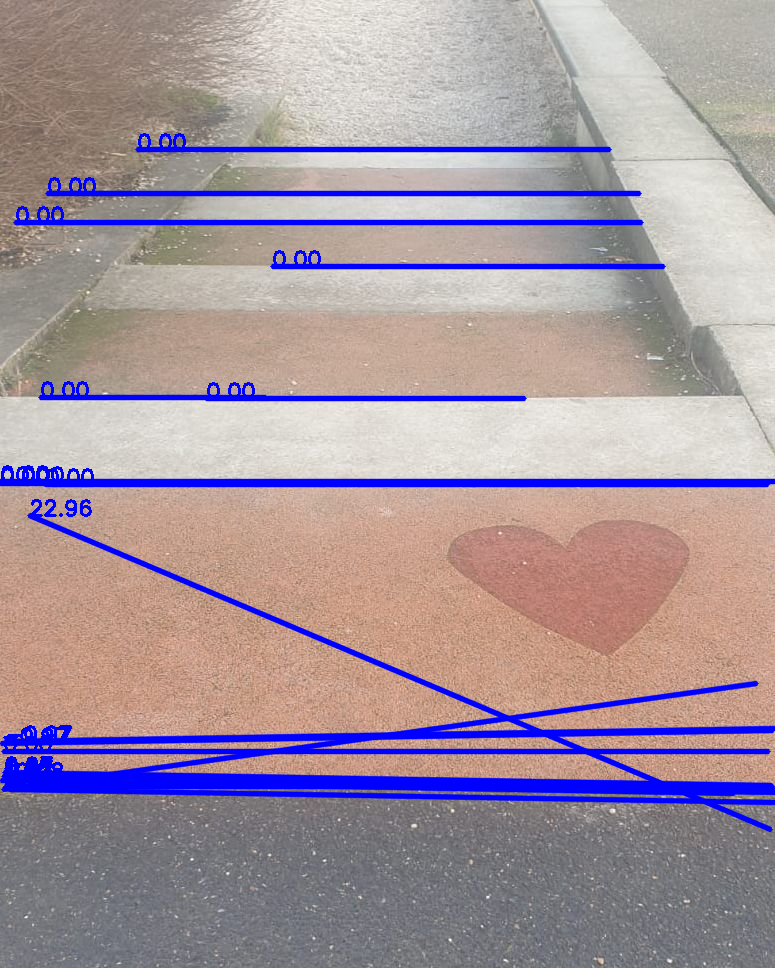

-1

In [94]:
import numpy as np
from google.colab.patches import cv2_imshow
image = cv2.imread("/content/Groupe2_Image1.jpeg")
canny = cv2.Canny(image, 100, 150)

theta = np.pi / 180
linesP = cv2.HoughLinesP(canny, rho=1, theta=theta, threshold=200, minLineLength=100, maxLineGap=100)
coordoniates_values=[]
used_angles = []
if linesP is not None:
    for line in linesP:
        x1, y1, x2, y2 = line[0]
        slope = (y2 - y1) / (x2 - x1)
        angle = np.atan(slope) * 180. / np.pi
        # Skip duplicated angles just for visualization
        similar = sum([np.abs(used_angle - angle) < 2 for used_angle in used_angles])
        #if similar:
            #continue
        used_angles.append(angle)
        coordoniates_values.append([x1,y1,x2,y2])

        if -45 < angle < 45:
            cv2.line(image, (x1, y1), (x2, y2), (255, 0, 0), 3, cv2.LINE_AA)
            cv2.putText(image, f'{angle:.2f}', (x1, y1), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)
        else:
            cv2.line(image, (x1, y1), (x2, y2), (0, 0, 255), 3, cv2.LINE_AA)
            cv2.putText(image, f'{angle:.2f}', (x1, y1), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)

cv2_imshow(image)
cv2.waitKey()

In [96]:
#regroupement selon angles
parallelLines = []
for a in used_angles:
    P_lines=[]
    for b in used_angles:
            if b is not a:
                    if 0 <= abs(a-b) <= 0.2:
                        P_lines.append(b)
    parallelLines.append(P_lines)


In [97]:
 parallelLines

[[np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0)],
 [np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0)],
 [np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0)],
 [np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0)],
 [np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.float64(0.0),
  np.flo

In [104]:
index=np.argmax(len(parallelLines))
idex

np.int64(0)

In [105]:
parallelLines[index]

[np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0)]

In [1]:
distinct_values=np.unique(used_angles)
angle_coordoniates=[]
def indices( mylist, value):
    return [coordoniates_values[i] for i,x in enumerate(mylist) if x==value]
#une fois les list
for i in distinct_values:
  angle_coordoniates.append(indices(used_angles,i))


SyntaxError: Missing parentheses in call to 'print'. Did you mean print(...)? (<ipython-input-1-39633ba8dfd0>, line 6)

In [ ]:
filter_index=[]
thresh_angle=0.2
for i in distinct_values:
  for j in distinct_values:
    if i is not j:
      if 0 <= abs(i-j) <= thresh_angle:
